# Covid-19 - The Story of the States

We are trying to understand the story of how the Covid infections and deaths have spread/increased in each state in the US,<BR>
and we are looking for a snapshot of this picture by every state.
<BR><BR>
Additonally we are trying to see how, how the vaccinations for each state are progressing, looking for a snapshot of the same over time<br>
and additionally we are looking to compare the vaccination numbers against the national average.


Finally, we look to find a correlation between the vaccination drive & the reported death count over time to see<br>
if there is evidence that vaccinations are indeed lowering the case/deaths in USA.

#### Data Analytics with Python


In [1]:
import pandas as pd
import numpy as np
from IPython.display import * 
display(HTML("<style>.container { width:100% !important; }</style>"))
pd.options.display.float_format = '{:,.2f}'.format

import seaborn as sns
import scipy as stats
from scipy.signal import argrelextrema
import matplotlib as mpl
from matplotlib.pylab import plt
import importlib
import datetime

pd.set_option('display.max_rows', 10)

# Infection

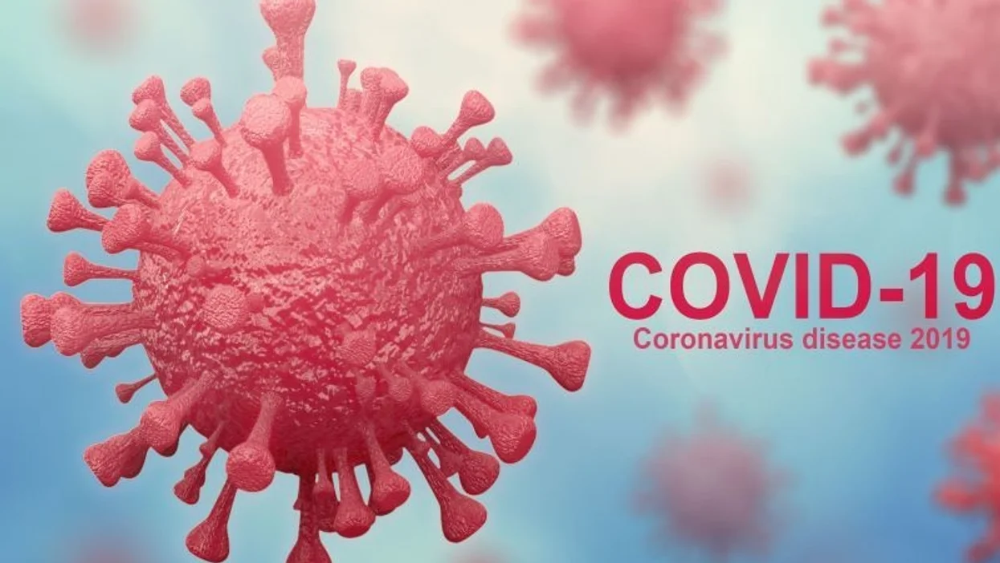

In [2]:
Image("infections.jpg", width=900, height=300)

In [3]:
# Data Source: https://www.kaggle.com/fireballbyedimyrnmom/us-counties-covid-19-dataset
# Which derives its data from the New York Times GITHUB source:
# [CSV US counties](About this file Edit https://raw.githubusercontent.com/nytimes/covid-19-data/master/us-counties.csv)

state_infections = pd.read_csv("https://raw.githubusercontent.com/nytimes/covid-19-data/master/us-counties.csv")

## Data Cleanup

In [4]:
# date is type object, changing it to datetype
state_infections.date = pd.to_datetime(state_infections.date)

# drop columns that aren't needed.
state_infections.drop(['county', 'fips'], axis=1, inplace=True)

# sort data by state
state_infections.sort_values(['state', 'date'], ascending=[True, True], inplace=True)

#### location has 55 unique entries
* "state" -> Maps to 55 different centers locations including the 50 states.
* So we want to clean this up, remove any additional data beyond the 50 states (+ District of Columbia)

In [5]:
# The dataset contains 55 unique states.
len(state_infections.state.unique())

55

In [6]:
us_states_list = pd.read_csv('states.csv')

# Filtering extra states
state_infections = state_infections[state_infections.state.isin(us_states_list.State)]
len(state_infections.state.unique())

51

In [7]:
# grouping all county values together.
state_infections = state_infections.groupby(['state','date'])[['cases','deaths']].sum()
state_infections.reset_index(inplace=True)

In [8]:
# Calculating daily cases and deaths.

state_infections['daily_cases'] = state_infections.groupby(["state"]).cases.shift(1)
state_infections['daily_deaths'] = state_infections.groupby(["state"]).deaths.shift(1)

# Filling na values with 0.
state_infections['daily_cases'].fillna(0, inplace = True)
state_infections['daily_deaths'].fillna(0, inplace = True)


state_infections['daily_cases'] = state_infections.cases - state_infections.daily_cases
state_infections['daily_deaths'] = state_infections.deaths - state_infections.daily_deaths


In [9]:
# checking for na values.
state_infections.isna().sum()

state           0
date            0
cases           0
deaths          0
daily_cases     0
daily_deaths    0
dtype: int64

In [10]:
# This is to remove the negative data seen for Daily Cases which was due to incorrect reporting

while(len(state_infections[state_infections.daily_cases < 0]) > 0):
    for index in state_infections.index[state_infections.daily_cases < 0]:
        state_infections.loc[index-1, "daily_cases"] = state_infections.loc[index-1, "daily_cases"] + state_infections.loc[index, "daily_cases"]
        state_infections.loc[index, "daily_cases"] = 0



In [11]:
# This is to remove the negative data seen for Daily Deaths which was due to incorrect reporting

while(len(state_infections[state_infections.daily_deaths < 0]) > 0):
    for index in state_infections.index[state_infections.daily_deaths < 0]:
        state_infections.loc[index-1, "daily_deaths"] = state_infections.loc[index-1, "daily_deaths"] + state_infections.loc[index, "daily_deaths"]
        state_infections.loc[index, "daily_deaths"] = 0


In [12]:
state_infections["cases_7_day_rolling_avg"] = state_infections.groupby("state").daily_cases.transform(lambda x: x.rolling(7).mean())
state_infections["deaths_7_day_rolling_avg"] = state_infections.groupby("state").daily_deaths.transform(lambda x: x.rolling(7).mean())

In [13]:
# This gets us Population data got from the US census Site as the estimated 2019 US population - by each state.

population = pd.read_csv("2019_Census_US_Population_Data_By_State_Lat_Long.csv")
population.columns = ["state", "population_estimate_2019", "latitude", "longitude"]


In [14]:
state_infections["population_estimate"] = state_infections.state.apply(lambda x: int(population[population.state == x].population_estimate_2019))

In [15]:
state_infections["cases_percent"] = state_infections.cases / state_infections.population_estimate * 100
state_infections["deaths_percent"] = state_infections.deaths / state_infections.population_estimate * 100
state_infections["daily_cases_percent"] = state_infections.daily_cases / state_infections.population_estimate * 100
state_infections["daily_deaths_percent"] = state_infections.daily_deaths / state_infections.population_estimate * 100
state_infections["rolling_avg_cases_percent"] = state_infections.cases_7_day_rolling_avg /state_infections.population_estimate * 100
state_infections["rolling_avg_deaths_percent"] = state_infections.deaths_7_day_rolling_avg /state_infections.population_estimate * 100


## Data Visualisations

In [16]:
# Calculating for the entire United States
us_infections = state_infections.groupby(['date'])[['cases','deaths', 'daily_cases', 'daily_deaths']].sum()
us_infections.reset_index(inplace=True)


In [17]:
us_infections["cases_7_day_rolling_avg"] = us_infections.daily_cases.transform(lambda x: x.rolling(7).mean())
us_infections["deaths_7_day_rolling_avg"] = us_infections.daily_deaths.transform(lambda x: x.rolling(7).mean())


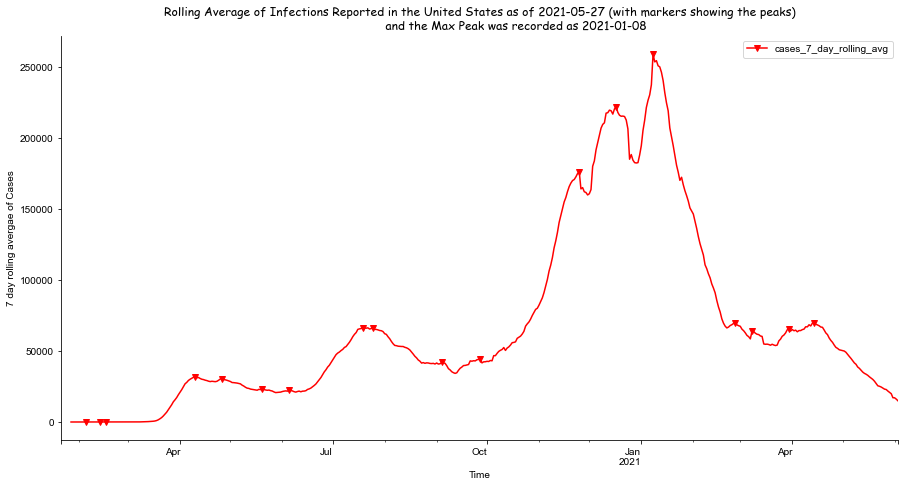

In [18]:
def cases_rolling_visulaization(dataframe, state):

    ilocs_min = argrelextrema(dataframe.cases_7_day_rolling_avg.values, np.less_equal, order=3)[0]
    ilocs_max = argrelextrema(dataframe.cases_7_day_rolling_avg.values, np.greater_equal, order=3)[0]
    
    max_infections = dataframe.cases_7_day_rolling_avg.max()
    data_peak = dataframe[dataframe.cases_7_day_rolling_avg == max_infections].reset_index()
    data_peak_val = data_peak.loc[0, 'date'].date().strftime("%Y-%m-%d")

    fig, ax = plt.subplots(1,1,figsize=(8,8))
    fig.autofmt_xdate()
    fig.set_size_inches(15, 8.27)

    dataframe.plot(x="date", y="cases_7_day_rolling_avg", ax=ax, color="red", markevery=ilocs_max, marker="v")

    ax.set_ylabel('7 day rolling avergae of Cases')
    ax.set_xlabel('Time')
    ax.set_title('''Rolling Average of Infections Reported in the {} as of {} (with markers showing the peaks)
                    and the Max Peak was recorded as {}'''.format(state, "2021-05-27", data_peak_val), fontdict={'family':'Comic Sans MS'})
    sns.set_style("whitegrid")
    sns.despine()
    state_name = state.replace(" ", "_")
    plt.savefig('pdfs\\{}_2_infections_{}.pdf'.format(state_name, datetime.datetime.now().strftime("%Y-%m-%d")) )


cases_rolling_visulaization(us_infections, "United States")

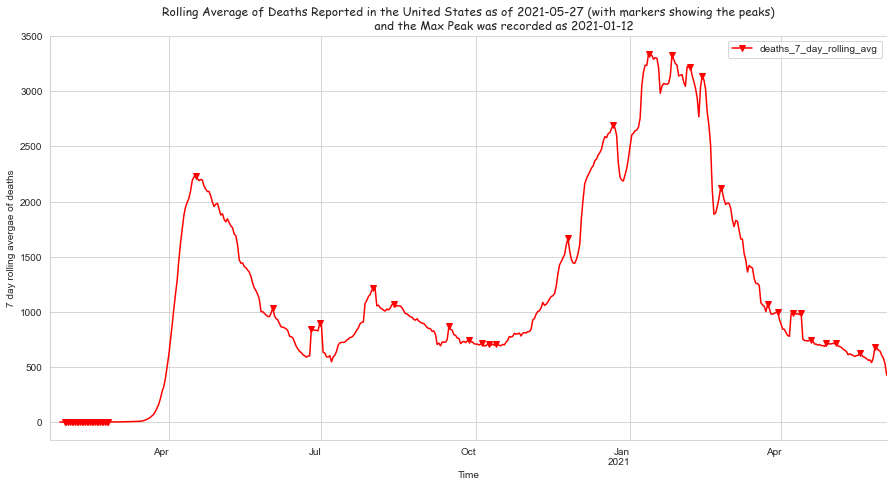

In [19]:
def deaths_rolling_visulaization(dataframe, state):

    ilocs_min = argrelextrema(dataframe.deaths_7_day_rolling_avg.values, np.less_equal, order=3)[0]
    ilocs_max = argrelextrema(dataframe.deaths_7_day_rolling_avg.values, np.greater_equal, order=3)[0]
    
    max_infections = dataframe.deaths_7_day_rolling_avg.max()
    data_peak = dataframe[dataframe.deaths_7_day_rolling_avg == max_infections].reset_index()
    data_peak_val = data_peak.loc[0, 'date'].date().strftime("%Y-%m-%d")

    fig, ax = plt.subplots(1,1,figsize=(8,8))
    fig.autofmt_xdate()
    fig.set_size_inches(15, 8.27)

    dataframe.plot(x="date", y="deaths_7_day_rolling_avg", ax=ax, color="red", markevery=ilocs_max, marker="v")

    ax.set_ylabel('7 day rolling avergae of deaths')
    ax.set_xlabel('Time')
    ax.set_title('''Rolling Average of Deaths Reported in the {} as of {} (with markers showing the peaks)
                    and the Max Peak was recorded as {}'''.format(state, "2021-05-27", data_peak_val), fontdict={'family':'Comic Sans MS'})
    sns.set_style("whitegrid")
    sns.despine()
    state_name = state.replace(" ", "_")
    plt.savefig('pdfs\\{}_3_deaths_{}.pdf'.format(state_name, datetime.datetime.now().strftime("%Y-%m-%d")) )


deaths_rolling_visulaization(us_infections, "United States")

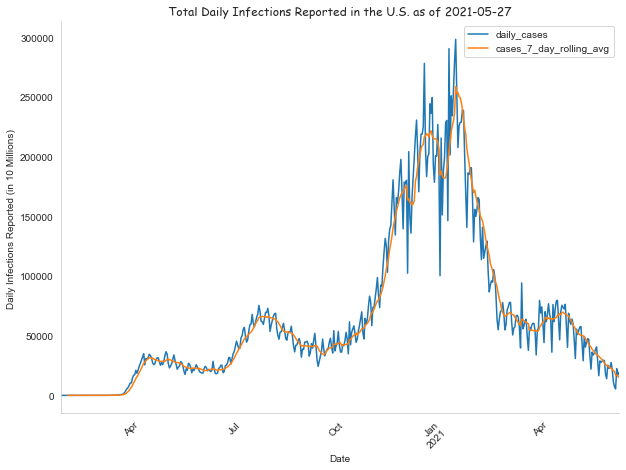

In [20]:
# Plotting graph for total infections reported in the United States.
fig, ax = plt.subplots(1,1,figsize=(8,8))
fig.autofmt_xdate()
fig.set_size_inches(10, 8)

us_infections.plot(x= "date", y=["daily_cases", "cases_7_day_rolling_avg"], ax=ax)
plt.xticks(rotation=45)
ax.set_ylabel('Daily Infections Reported (in 10 Millions) ')
ax.set_xlabel('Date')
ax.set_title('''Total Daily Infections Reported in the U.S. as of {}'''.format("2021-05-27"), fontdict={'family':'Comic Sans MS'})
ax.grid(False)
sns.set_style("whitegrid")
sns.despine()


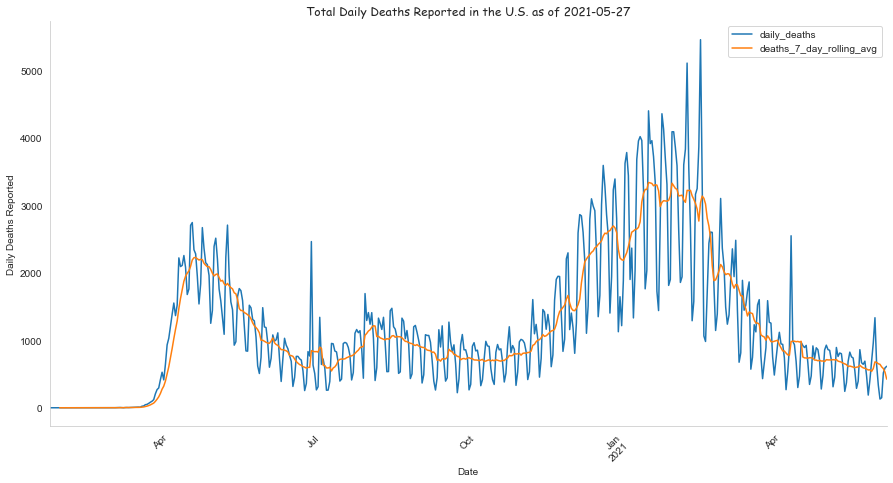

In [21]:
# Plotting graph for total infections reported in the United States.
fig, ax = plt.subplots(1,1,figsize=(8,8))
fig.autofmt_xdate()
fig.set_size_inches(15, 8.27)

us_infections.plot(x= "date", y=["daily_deaths", "deaths_7_day_rolling_avg"], ax=ax)
plt.xticks(rotation=45)
ax.set_ylabel('Daily Deaths Reported')
ax.set_xlabel('Date')
ax.set_title('''Total Daily Deaths Reported in the U.S. as of {}'''.format("2021-05-27"), fontdict={'family':'Comic Sans MS'})
ax.grid(False)
sns.set_style("whitegrid")
sns.despine()


State Name: Alaska
State Name: Alabama
State Name: Arkansas
State Name: Arizona
State Name: California
State Name: Colorado
State Name: Connecticut
State Name: District of Columbia
State Name: Delaware
State Name: Florida
State Name: Georgia


<ipython-input-18-d43f6b45192d>:10: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(1,1,figsize=(8,8))


State Name: Hawaii
State Name: Iowa
State Name: Idaho
State Name: Illinois
State Name: Indiana
State Name: Kansas
State Name: Kentucky
State Name: Louisiana
State Name: Massachusetts
State Name: Maryland
State Name: Maine
State Name: Michigan
State Name: Minnesota
State Name: Missouri
State Name: Mississippi
State Name: Montana
State Name: North Carolina
State Name: North Dakota
State Name: Nebraska
State Name: New Hampshire
State Name: New Jersey
State Name: New Mexico
State Name: Nevada
State Name: New York
State Name: Ohio
State Name: Oklahoma
State Name: Oregon
State Name: Pennsylvania
State Name: Rhode Island
State Name: South Carolina
State Name: South Dakota
State Name: Tennessee
State Name: Texas
State Name: Utah
State Name: Virginia
State Name: Vermont
State Name: Washington
State Name: Wisconsin
State Name: West Virginia
State Name: Wyoming


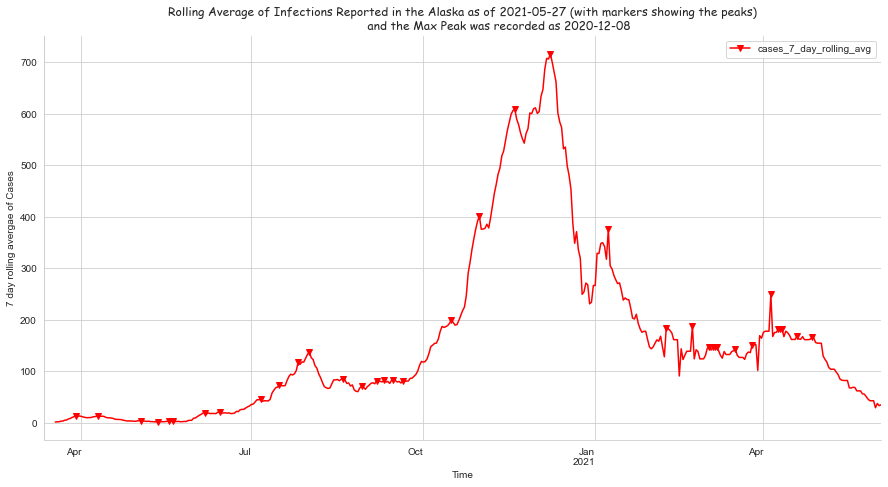

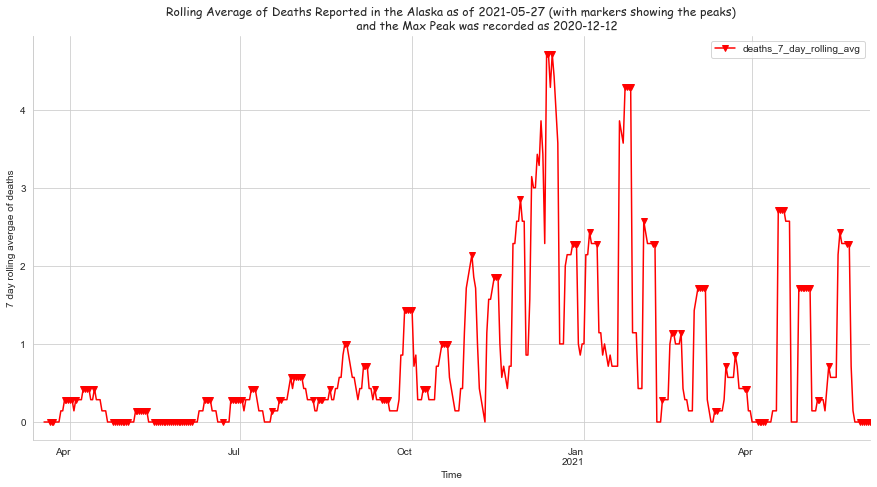

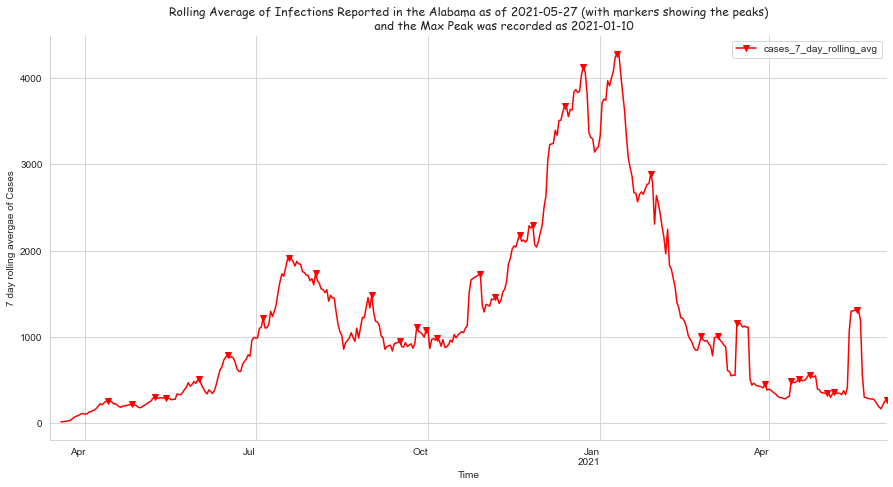

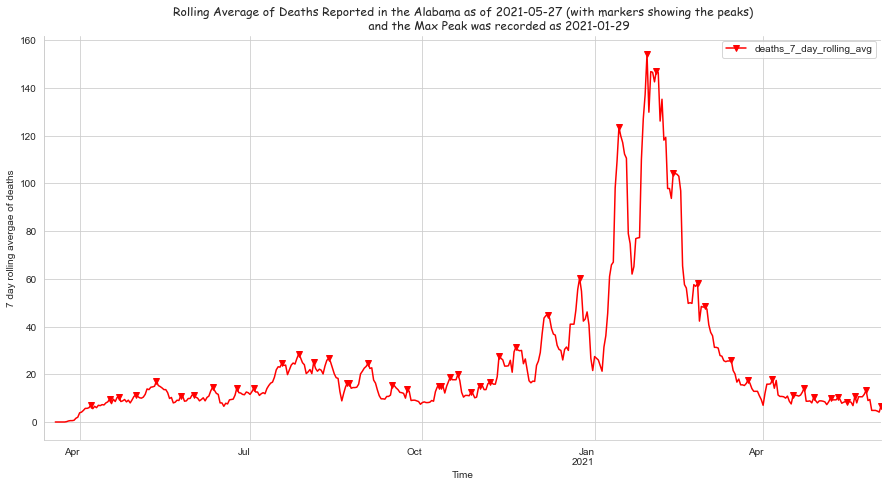

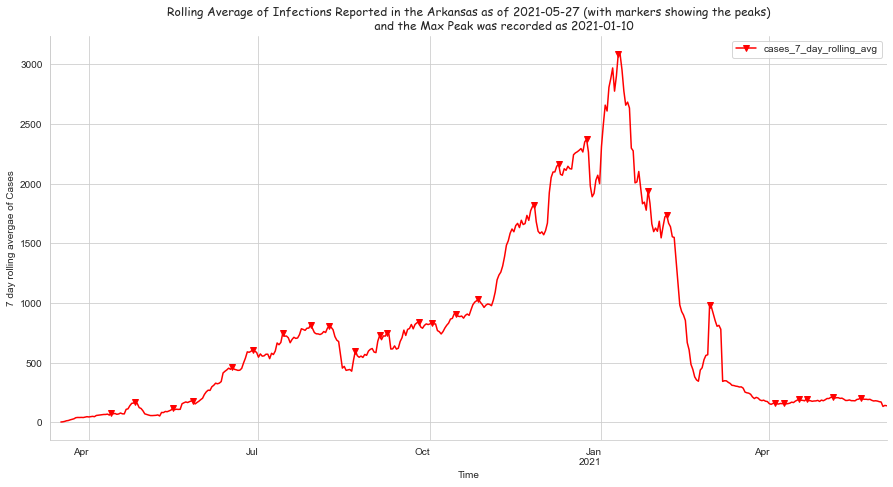

...

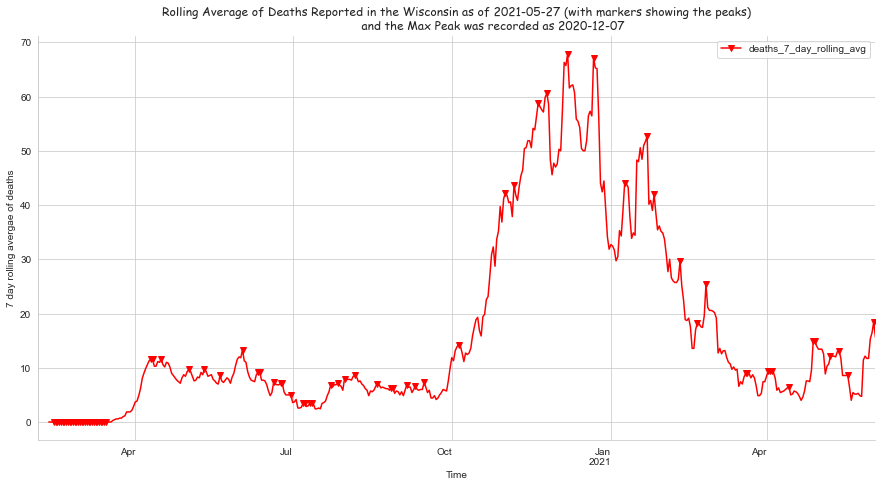

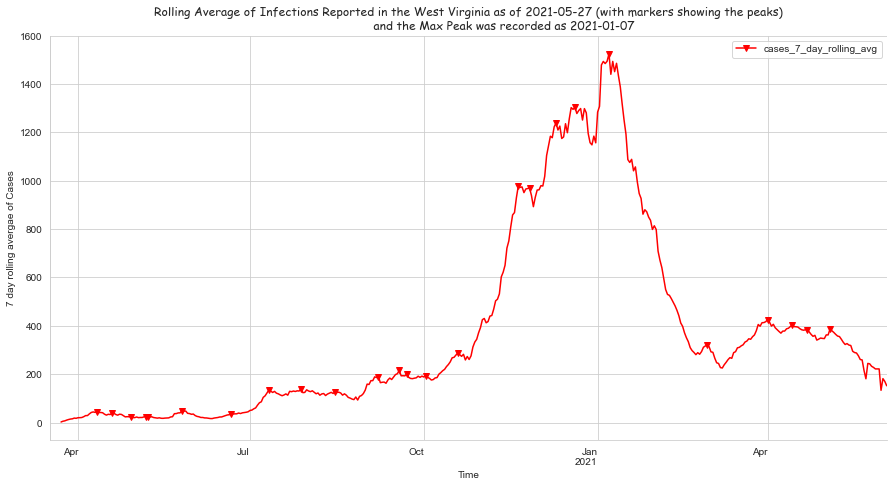

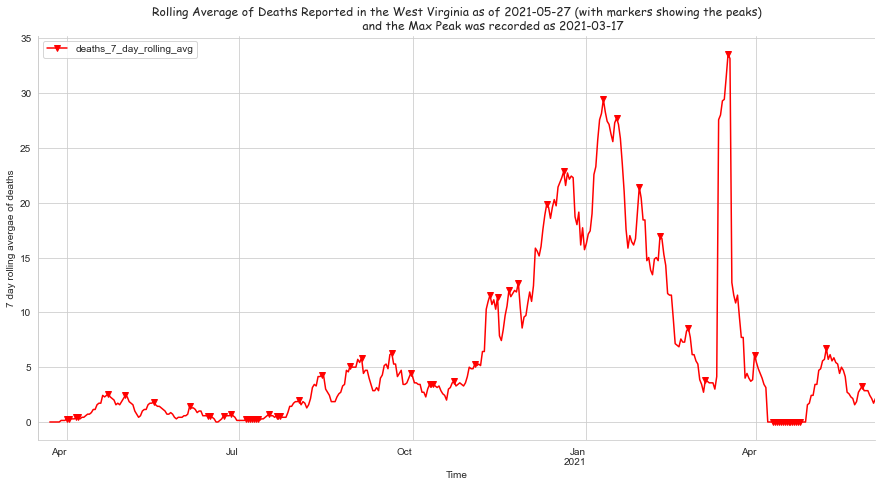

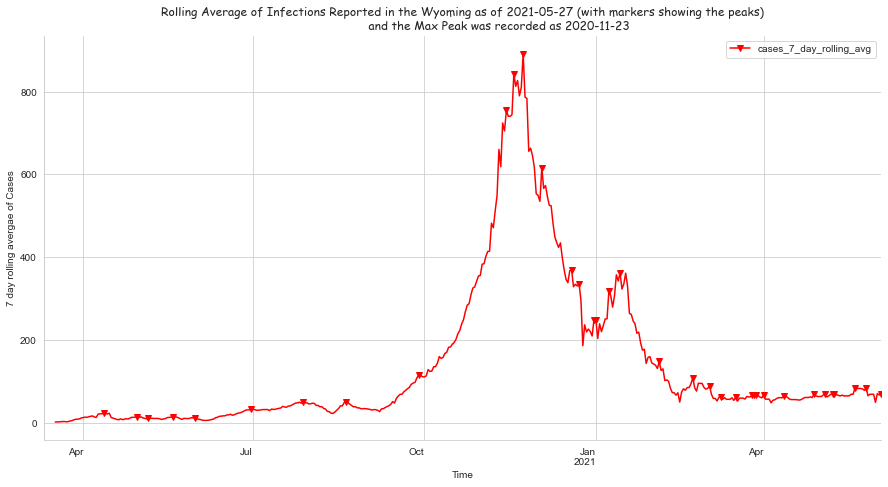

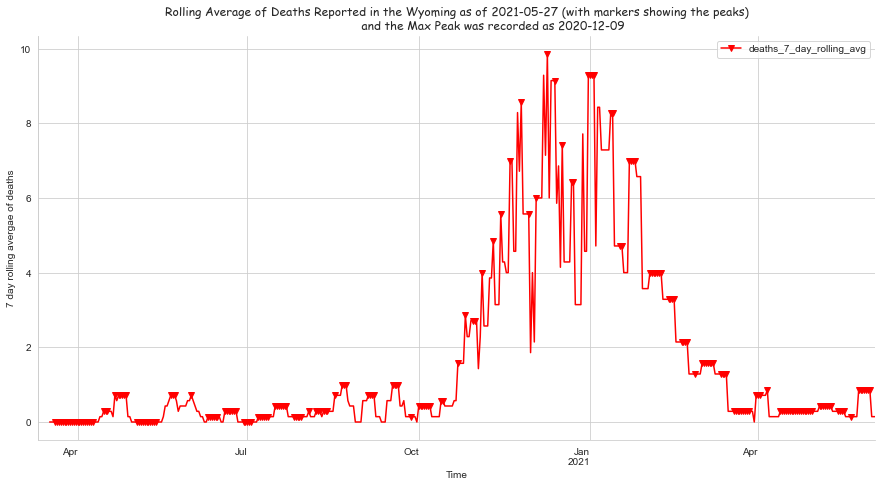

In [22]:
# Looping through each state.
for state in us_states_list.State:
    print("State Name: {}".format(state))
    df = state_infections[state_infections.state == state]
    cases_rolling_visulaization(df, state)
    deaths_rolling_visulaization(df, state)


# Vaccinations

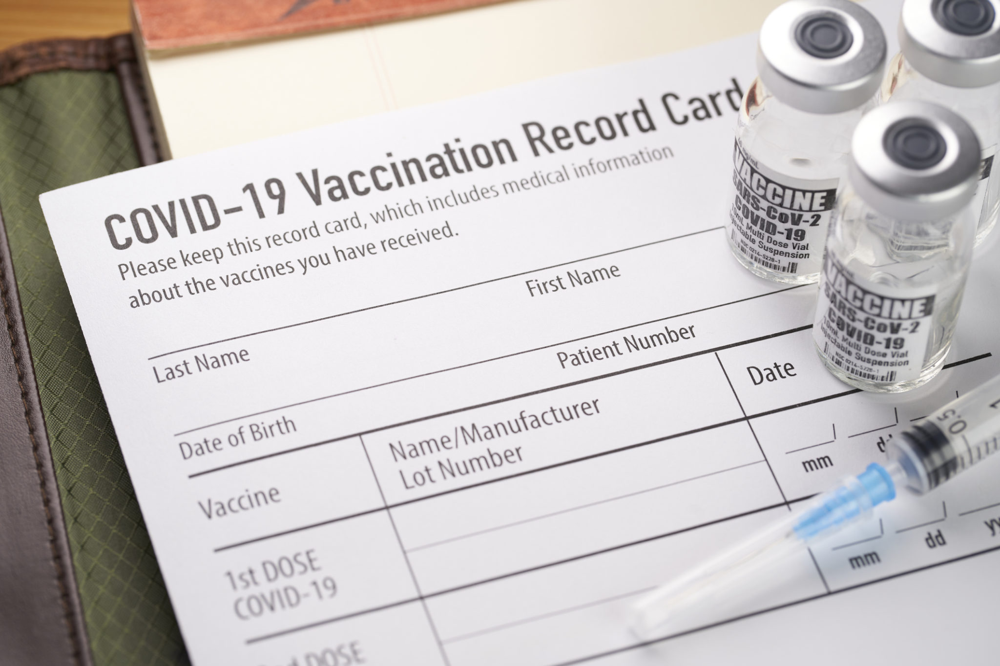

In [23]:
Image("vaccinations.jpg", width=900, height=300)

In [24]:
# Data Source: https://www.kaggle.com/paultimothymooney/usa-covid19-vaccinations
# Whcih derives its data from https://ourworldindata.org/us-states-vaccinations & which in turn derives its data from the CDC Website.

vaccinations = pd.read_csv("https://covid.ourworldindata.org/data/vaccinations/us_state_vaccinations.csv")

In [25]:
# Date needs to be converted to DateTime[64]
vaccinations.date = pd.to_datetime(vaccinations.date)

# We do not care about: share_doses_used, distributed_per_hundred, total_distributed, daily_vaccinations_raw
vaccinations.drop(columns=["share_doses_used", "distributed_per_hundred", "total_distributed", "daily_vaccinations_raw"], inplace=True)

# New York is ddefined as "New York State" - so just looking to remove the " State" so that when we match it up against other data, we can collate the data together.
vaccinations["location"] = vaccinations.location.apply(lambda x: str(x if "New York" not in x else "New York"))

### Data Cleanup

#### location has 65 unique entries
* "Location" -> Maps to 65 different centers locations including the 50 states.
* So we want to clean this up, remove any additional data beyond the 50 states (+ District of Columbia)

#### daily_vaccination = 0
* daily_vaccintion field when marked as 0 -> the total_infections is the base vaccination count, for whcih we do not have data as to how many of these were done on which day.
* THUS **base_vaccination_count** -> Create this new field


#### total_vaccintion field incorrectly computed
* total_vaccination field is incorrectly computed -> recompute as a Cumaltive-Sum of daily_vaccination + the "base_vaccination_count"

#### missing data for multiple fields: people_vaccinated, people_fully_vaccinated_per_hundred, total_vaccinations_per_hundred, people_fully_vaccinated, people_vaccinated_per_hundred
* All the columns mentioned can be easily forward filled with no impact - considering exactly no new vaccinations for the day!

#### Potential Population
* Using the data in daily_vaccinations_per_million and dail_vaccinations, we can get a "potential population" field (kept in millions to avoid rounding errors)

In [26]:
# Let us find how many "states data is being mapped here:"
print("Total unqiue locations in the data are {}.".format(len(vaccinations.location.unique())))

# So we have 65 states instead of 50 + 1 (District of Columbia).
# So for now we only want to focus on the 50 states. We will drop rest of the data
# Data Source: https://www.kaggle.com/omer2040/usa-states-to-region

us_states = pd.read_csv("states.csv")

# So here we remove any data that is not mapped to our 50 (+1) states.
vaccinations = vaccinations[vaccinations.location.isin(us_states.State)]

print("Updated unqiue locations (to contain only 50 states + 1) count is {}.".format(len(vaccinations.location.unique())))


Total unqiue locations in the data are 65.
Updated unqiue locations (to contain only 50 states + 1) count is 51.


In [27]:
# Now there are many rows where "daily_vaccinations" are nan
# This is where we have 1 record per state
# This is the initial record i.e. the starting number of cases per state

initial_loading_data = vaccinations[vaccinations.daily_vaccinations.isnull()]
vaccinations["base_vaccination_count"] = vaccinations.location.apply(lambda x: int(initial_loading_data[initial_loading_data.location == x].total_vaccinations))

In [28]:
# Now apply cum-sum for daily_vaccintions plus using the base_vaccintion_count, we can recompute the total_vaccinations

vaccinations["daily_vaccinations"] = vaccinations["daily_vaccinations"] .fillna(0)
vaccinations["total_vaccinations"] = vaccinations.base_vaccination_count + vaccinations.groupby(["location"]).daily_vaccinations.apply(lambda x: x.cumsum())

In [29]:
## Multiple columns that do not have data - can be simply forward filled - because all data is a cumalative sum.
ff_columns = ["people_vaccinated", "people_fully_vaccinated_per_hundred", "total_vaccinations_per_hundred", "people_fully_vaccinated", "people_vaccinated_per_hundred"]
vaccinations[ff_columns] = vaccinations.groupby("location")[ff_columns].ffill()

## After this if we still have nulls - it is only for intial data, that can be all set to 0
vaccinations[ff_columns] = vaccinations[ff_columns].fillna(0)

In [30]:
vaccinations["potential_population_in_millions"] = vaccinations.daily_vaccinations / vaccinations.daily_vaccinations_per_million

In [31]:
# And now we can remove the records where daily_vaccinations is 0. So we will end up with all clean final data, and we are ready for visualizations.

vaccinations = vaccinations[vaccinations.daily_vaccinations != 0.0]

## Data Visualisations

In [32]:
# Now combining all data at the USA level, to get a basic understanding of the vaccination trend for all of USA:

vaccinations_grouped = vaccinations.groupby("date")["total_vaccinations", "people_vaccinated", "people_fully_vaccinated",
                                                    "daily_vaccinations", "base_vaccination_count",
                                                    "potential_population_in_millions"].apply(lambda x : x.sum())

vaccinations_grouped.reset_index(inplace=True)
vaccinations_grouped["people_fully_vaccinated_per_hundred"] = vaccinations_grouped.people_fully_vaccinated/vaccinations_grouped.potential_population_in_millions/10**4
vaccinations_grouped["people_vaccinated_per_hundred"] = vaccinations_grouped.people_vaccinated/vaccinations_grouped.potential_population_in_millions/10**4
vaccinations_grouped["date_str"] = vaccinations_grouped.date.apply(lambda x: x.strftime("%Y-%m-%d"))

<ipython-input-32-16635a424908>:3: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  vaccinations_grouped = vaccinations.groupby("date")["total_vaccinations", "people_vaccinated", "people_fully_vaccinated",


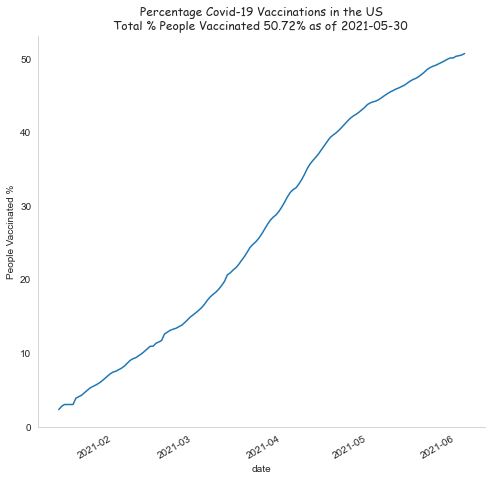

In [33]:
import datetime
%matplotlib inline

fig, ax = plt.subplots(1,1,figsize=(8,8))
sns.lineplot(x=vaccinations_grouped.date, y=vaccinations_grouped.people_vaccinated/vaccinations_grouped.potential_population_in_millions/10**4, ax=ax)
fig.autofmt_xdate()
ax.set_ylabel('People Vaccinated %')
ax.set_title('''Percentage Covid-19 Vaccinations in the US\nTotal % People Vaccinated {:.2f}% as of {} '''.format(
                                                vaccinations_grouped.people_vaccinated.max()/vaccinations_grouped.potential_population_in_millions.max()/10**4, 
                                                "2021-05-30"), fontdict={'family':'Comic Sans MS'})
ax.grid(False)
sns.set_style("whitegrid")
sns.despine()


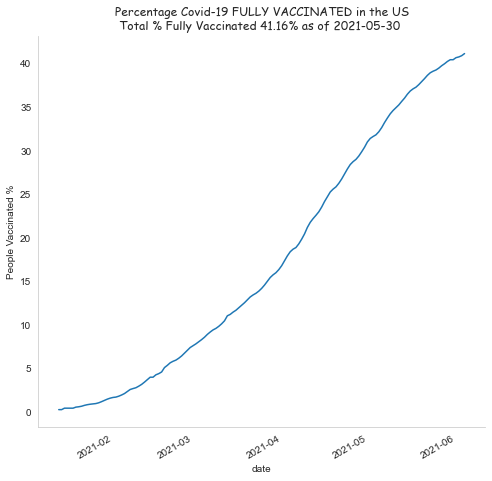

In [34]:
%matplotlib inline

fig, ax = plt.subplots(1,1,figsize=(8,8))
sns.lineplot(x=vaccinations_grouped.date, y=vaccinations_grouped.people_fully_vaccinated/vaccinations_grouped.potential_population_in_millions/10**4, ax=ax)
fig.autofmt_xdate()
ax.set_ylabel('People Vaccinated %')
ax.set_title('''Percentage Covid-19 FULLY VACCINATED in the US\nTotal % Fully Vaccinated {:.2f}% as of {} '''.format(
                                                vaccinations_grouped.people_fully_vaccinated.max()/vaccinations_grouped.potential_population_in_millions.max()/10**4, 
                                                "2021-05-30"), fontdict={'family':'Comic Sans MS'})
ax.grid(False)
sns.set_style("whitegrid")
sns.despine()

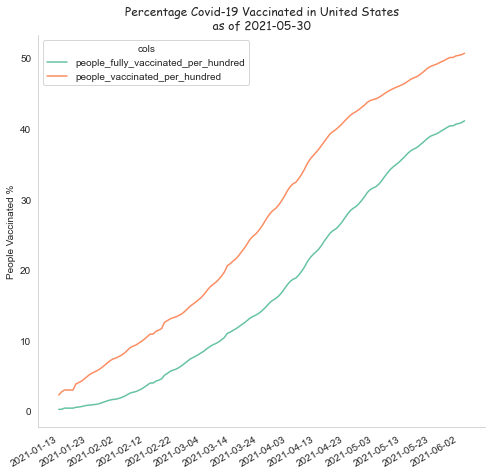

In [35]:
def plot_vaccination_data(dataframe, state, state_compare=False):
    
    state_name = state.replace(" ", "_")
    
    fig, ax = plt.subplots(1,1,figsize=(8,8))
    fig.autofmt_xdate()
    
    columns = ["people_fully_vaccinated_per_hundred", "people_vaccinated_per_hundred"];

    if state_compare:
        columns.append("US_people_fully_vaccinated_per_hundred")
        columns.append("US_people_vaccinated_per_hundred")
    df = dataframe.melt(id_vars='date_str', value_vars=columns, var_name='cols',  value_name='vals')
    plot_ = sns.lineplot(x="date_str", y="vals", hue='cols', data=df, palette="Set2", ax=ax)

    #ax.xaxis.set_major_formatter(mpl.dates.DateFormatter('%Y.%m.%d'))

    for ind, label in enumerate(plot_.get_xticklabels()):
        if ind % 10 == 0:  # every 10th label is kept
            label.set_visible(True)
        else:
            label.set_visible(False)

    ax.set_ylabel('People Vaccinated %')
    ax.set_xlabel('')
    if state_compare:
        ax.set_title('''Percentage Covid-19 Vaccinated in {}\nv/s Vaccinations across all of USA\n as of {} '''.format(state, "2021-05-30"), fontdict={'family':'Comic Sans MS'})
    else:
        ax.set_title('''Percentage Covid-19 Vaccinated in {}\n as of {} '''.format(state, "2021-05-30"), fontdict={'family':'Comic Sans MS'})

    ax.grid(False)
    sns.despine()
    sns.set_style("whitegrid")
    plt.savefig('pdfs\\{}_4_vaccinations_{}.pdf'.format(state_name, datetime.datetime.now().strftime("%Y-%m-%d")) )
    # Save PDF!

plot_vaccination_data(vaccinations_grouped, "United States")

In [36]:
## We first add other columns that are required for the charting of State v/s the country progress

vaccinations["date_str"] = vaccinations.date.apply(lambda x: x.strftime("%Y-%m-%d"))
vaccinations["US_people_fully_vaccinated_per_hundred"] = vaccinations.date.apply(lambda x: float(vaccinations_grouped[vaccinations_grouped.date == x].people_fully_vaccinated_per_hundred))
vaccinations["US_people_vaccinated_per_hundred"] = vaccinations.date.apply(lambda x: float(vaccinations_grouped[vaccinations_grouped.date == x].people_vaccinated_per_hundred))



State Name: Alaska
**********************************
State Name: Alabama
**********************************
State Name: Arkansas
**********************************
State Name: Arizona
**********************************
State Name: California
**********************************
State Name: Colorado
**********************************
State Name: Connecticut
**********************************
State Name: District of Columbia
**********************************
State Name: Delaware
**********************************
State Name: Florida
**********************************
State Name: Georgia
**********************************
State Name: Hawaii
**********************************
State Name: Iowa
**********************************
State Name: Idaho
**********************************
State Name: Illinois
**********************************
State Name: Indiana
**********************************
State Name: Kansas
**********************************
State Name: Kentucky
****************************

<ipython-input-35-0ad93ddf498c>:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(1,1,figsize=(8,8))


**********************************
State Name: Maine
**********************************
State Name: Michigan
**********************************
State Name: Minnesota
**********************************
State Name: Missouri
**********************************
State Name: Mississippi
**********************************
State Name: Montana
**********************************
State Name: North Carolina
**********************************
State Name: North Dakota
**********************************
State Name: Nebraska
**********************************
State Name: New Hampshire
**********************************
State Name: New Jersey
**********************************
State Name: New Mexico
**********************************
State Name: Nevada
**********************************
State Name: New York
**********************************
State Name: Ohio
**********************************
State Name: Oklahoma
**********************************
State Name: Oregon
**********************************
St

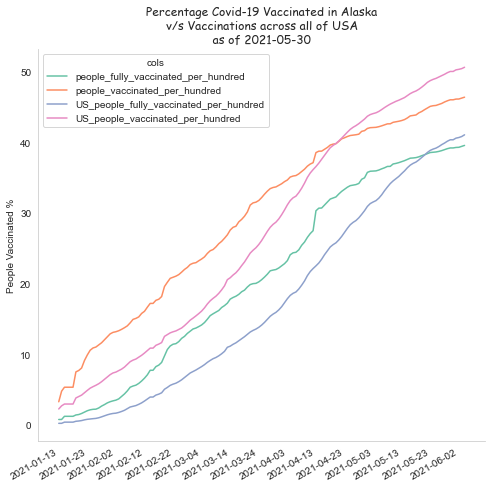

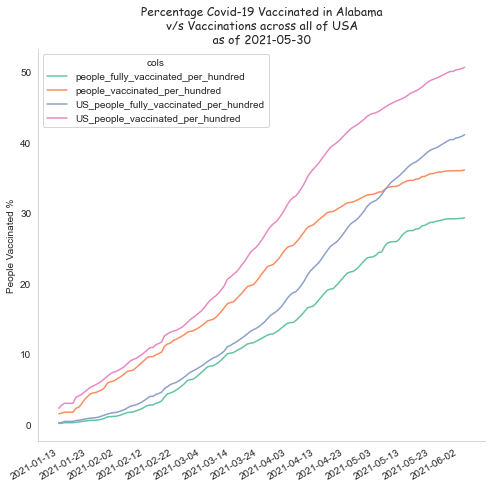

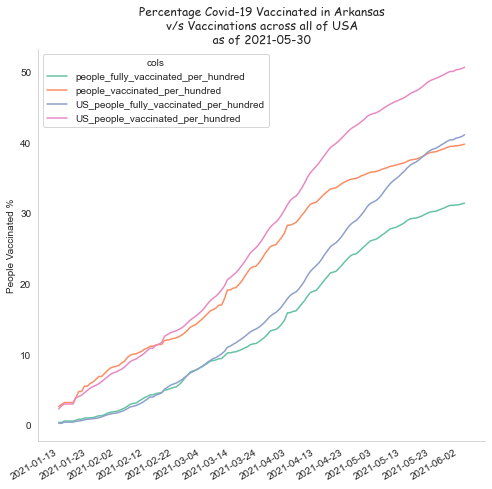

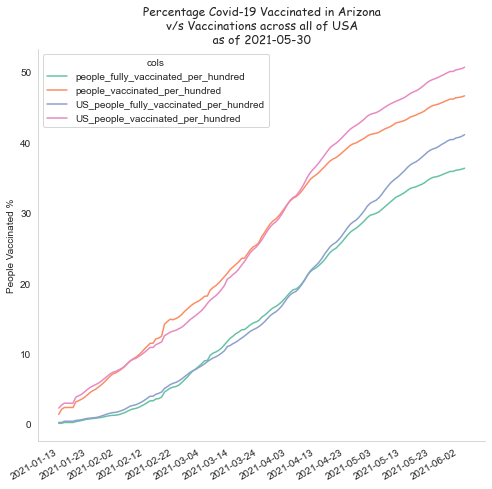

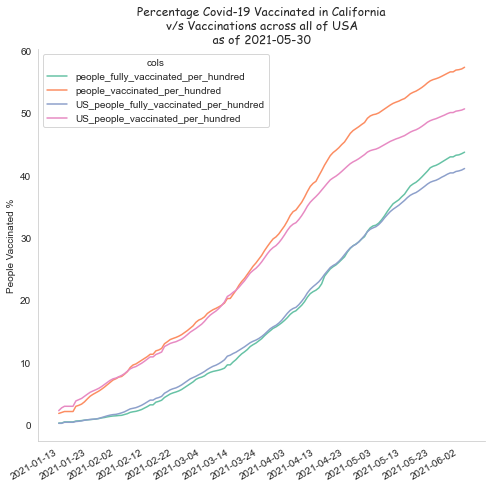

...

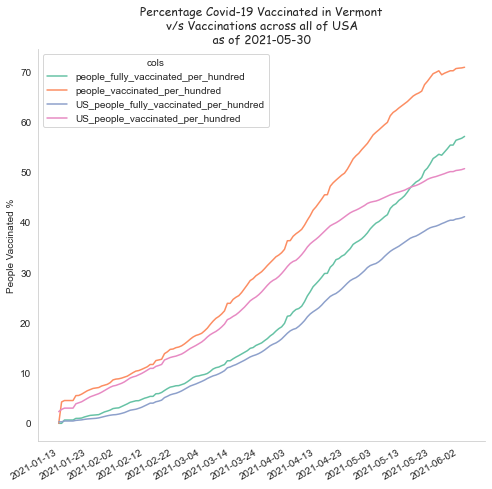

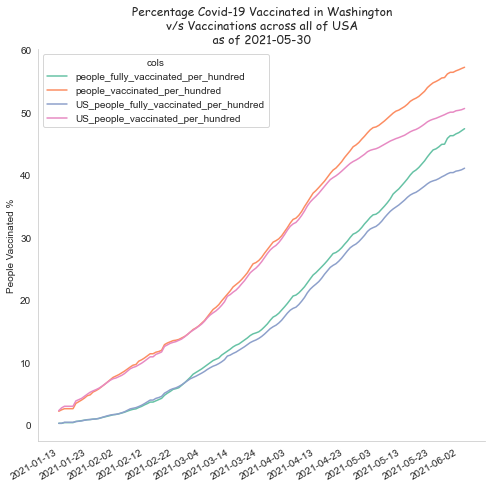

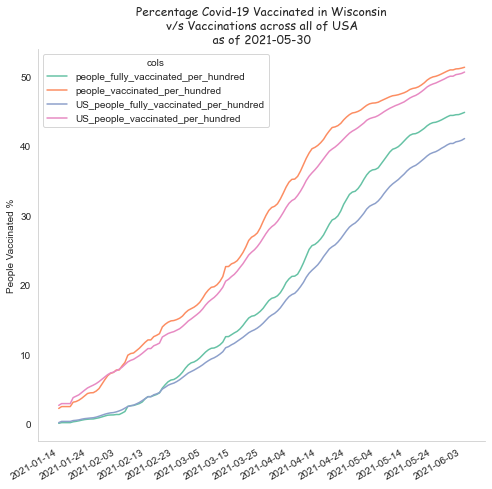

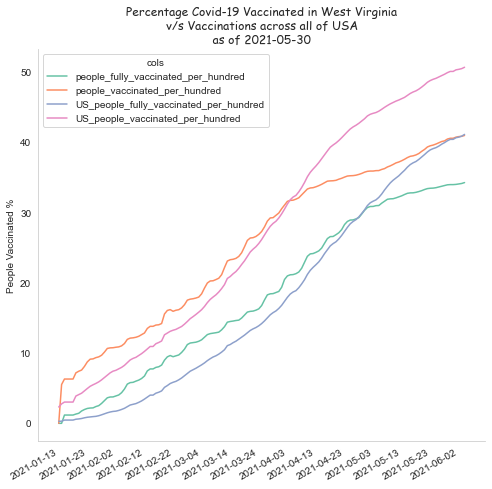

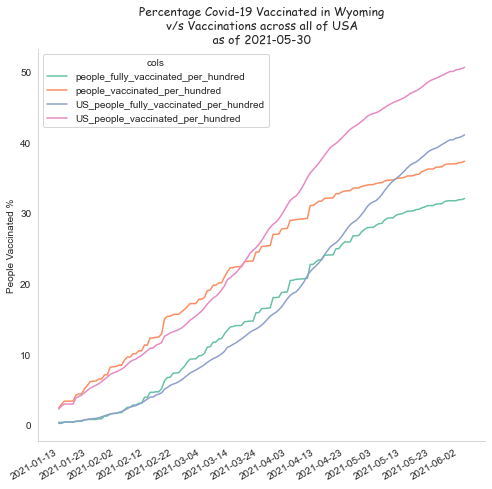

In [37]:
## We loop over each state
for state in us_states.State:
    print("State Name: {}".format(state))
    plot_vaccination_data(vaccinations[vaccinations.location == state], state, True)
    print("**********************************")



In [38]:
# To check for the top 5 and bottom 5 performing states for the Vaccination Drive, we are getting the latest data from the vaccination dataset
# And using this to populate the bar graph

In [39]:
latest_vaccination_data = vaccinations.sort_values(by=["location", "date"], ascending=[True, False]).groupby("location").first().reset_index()

In [40]:
latest_vaccination_data.drop(columns=["daily_vaccinations", "daily_vaccinations_per_million", "base_vaccination_count", "potential_population_in_millions", "date_str"], inplace=True)

In [41]:
latest_vaccination_data.sort_values("people_vaccinated_per_hundred", inplace=True)
histogram_view = pd.concat([latest_vaccination_data.head(5), latest_vaccination_data.tail(5)])
histogram_view.reset_index(inplace=True)


In [42]:
histogram_view = histogram_view.append(pd.Series(), ignore_index = True)
histogram_view.loc[[len(histogram_view)-1],'location'] = "United States"
histogram_view.loc[[len(histogram_view)-1],'people_fully_vaccinated_per_hundred'] = 40.46
histogram_view.loc[[len(histogram_view)-1],'people_vaccinated_per_hundred'] = 50.13
histogram_view.loc[[len(histogram_view)-1],'date'] = datetime.datetime(2020, 5, 30)
histogram_view.sort_values("people_vaccinated_per_hundred", inplace=True)

<ipython-input-42-33f530a81fab>:1: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  histogram_view = histogram_view.append(pd.Series(), ignore_index = True)


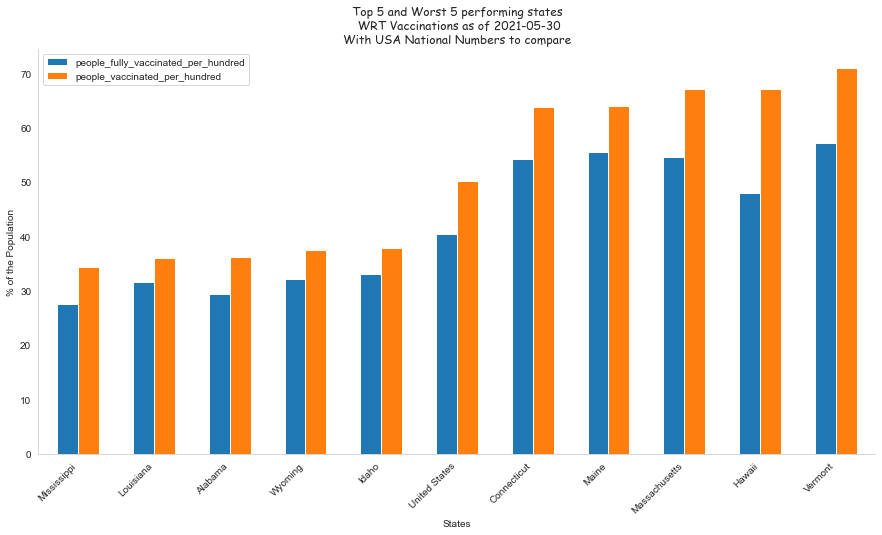

In [43]:
fig, ax = plt.subplots(1,1,figsize=(8,8))
fig.autofmt_xdate()
fig.set_size_inches(15, 8.27)
histogram_view.plot(x="location", y=["people_fully_vaccinated_per_hundred", "people_vaccinated_per_hundred"], kind="bar", ax=ax, width=0.55)
ax.grid(False)
plt.xticks(rotation=45)
ax.set_ylabel('% of the Population')
ax.set_xlabel('States')
ax.set_title('''Top 5 and Worst 5 performing states\n WRT Vaccinations as of {}\nWith USA National Numbers to compare'''.format("2021-05-30"), fontdict={'family':'Comic Sans MS'})
sns.set_style("whitegrid")
sns.despine()
plt.savefig("State_Performance_Histogram.jpg")

# PDF Fill using PDF Template File & a custom built dictionary

In [44]:
! pip install pypdftk

In [45]:
import pypdftk
import glob
import os

In [46]:
def get_state_dictionary(state):
    fields = {
            "State": state,
            "Total_Case_Count": state_infections[state_infections.state == state].cases.max(),
            "Percentage_Case_Count": "{}%".format(round(state_infections[state_infections.state == state].cases_percent.max(), 2)),
            "Total_Death_Count": state_infections[state_infections.state == state].deaths.max(),
            "Percentage_Death_Count": "{}%".format(round(state_infections[state_infections.state == state].deaths_percent.max(), 2)),
            "Total_Vaccination_Count": latest_vaccination_data[latest_vaccination_data.location == state].total_vaccinations.max(),
            "Percentage_Vaccination_Count": "{}%".format(latest_vaccination_data[latest_vaccination_data.location == state].people_vaccinated_per_hundred.max()),
            "Total_Fully_Vaccinated_Count": latest_vaccination_data[latest_vaccination_data.location == state].people_fully_vaccinated.max(),
            "Percentage_Fully_Vaccinated_Count": "{}%".format(latest_vaccination_data[latest_vaccination_data.location == state].people_fully_vaccinated_per_hundred.max())
    }
    return fields

TEMPLATE_PATH = "C:\\Users\\aakas\\Downloads\Covid_19_State_Form.pdf"

for state in us_states.State:
    state_name = state.replace(" ", "_")
    print("State Name: {}".format(state))
    OUTPUT_PATH = "pdfs\\{}_1_form.pdf".format(state_name)
    fields = get_state_dictionary(state)
    pypdftk.fill_form(pdf_path=TEMPLATE_PATH, datas=fields,
                  out_file=OUTPUT_PATH, flatten=False)
    file_list = glob.glob("pdfs\\{}*.pdf".format(state_name))
    pypdftk.concat(file_list, out_file="pdfs\\{}.pdf".format(state_name))
    for file in file_list:
        os.remove(file)
    print("**********************************")


State Name: Alaska
**********************************
State Name: Alabama
**********************************
State Name: Arkansas
**********************************
State Name: Arizona
**********************************
State Name: California
**********************************
State Name: Colorado
**********************************
State Name: Connecticut
**********************************
State Name: District of Columbia
**********************************
State Name: Delaware
**********************************
State Name: Florida
**********************************
State Name: Georgia
**********************************
State Name: Hawaii
**********************************
State Name: Iowa
**********************************
State Name: Idaho
**********************************
State Name: Illinois
**********************************
State Name: Indiana
**********************************
State Name: Kansas
**********************************
State Name: Kentucky
****************************

### Regression Analysis

We are trying to find the correlation for the no of deaths reported each day.

As with the analysis, we are again using the 7-day-rolling-average - to be able to get a clearer picture.

We are looking at the following dependent variables:

* Vaccination % (at least 1 dose)
* Vaccination % (fully vaccinated)
* No. of cases reported in the last 14 days (prior to current date) [Because there is always a lead time from infection to death]


In [47]:
regression_df = pd.merge(vaccinations_grouped, us_infections, how="inner", left_on=["date"], right_on=["date"])

In [48]:
# The 14 day rolling sum is calculauted in millions to enable easier regression analysis.

regression_df["temp_daily_cases"] = regression_df.daily_cases.shift(1)
regression_df["14_day_rolling"] = regression_df.temp_daily_cases.transform(lambda x: x.rolling(14).sum()/1000000)

regression_df["log_fully_vaccinated_per_hundred"] = np.log(regression_df.people_fully_vaccinated_per_hundred)
regression_df["log_vaccinated_per_hundred"] = np.log(regression_df.people_vaccinated_per_hundred)
regression_df.reset_index(inplace=True)

In [49]:
regression_df = regression_df[regression_df["14_day_rolling"].isnull() == False]
# Removing data which is NA as some libraries throw an error in these cases

,x,y
14,1.08,"3,291.57"
15,1.21,"3,253.29"
16,1.36,"3,237.14"
17,1.50,"3,139.86"
18,1.61,"3,146.14"


D:\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


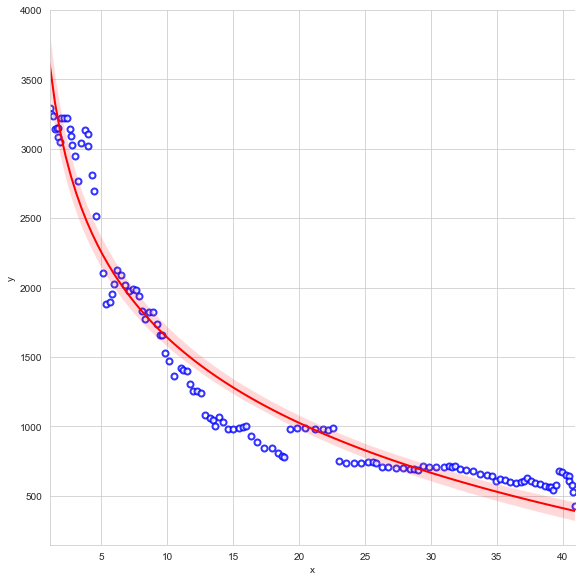

In [50]:
# 1. No. of Deaths (7 day) <- % of People Fully Vaccinated

df = pd.DataFrame({'x': regression_df.people_fully_vaccinated_per_hundred, 'y': regression_df.deaths_7_day_rolling_avg})
display(df.head())
ax = sns.lmplot('x', 'y', data=df, height=8, logx=True,
           scatter_kws={'color':'white', 
                        'marker':'o', 
                        'edgecolor':'blue', 
                        'linewidths':2}
          ,line_kws={'color':'red', 'linewidth':2}, 
           ci=99.99)

# The best fit, on visual discrimination is the log Linear model.

,x,y
14,1.08,"3,291.57"
15,1.21,"3,253.29"
16,1.36,"3,237.14"
17,1.50,"3,139.86"
18,1.61,"3,146.14"


D:\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


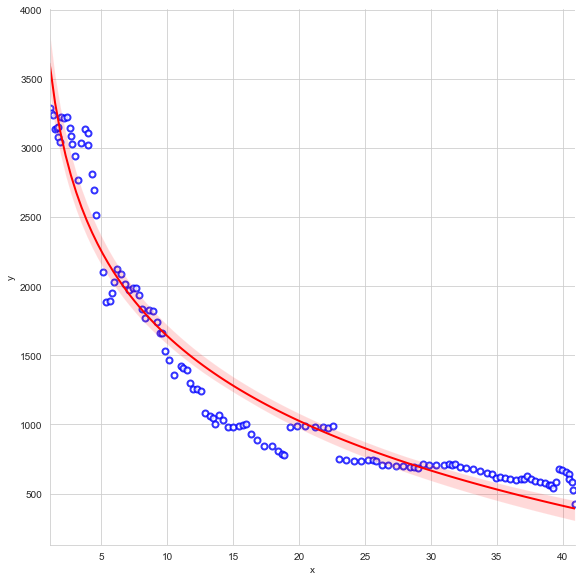

In [51]:
# 2. No. of Deaths (7 day) <- % of People Vaccinated (at least 1 dose)

df = pd.DataFrame({'x': regression_df.people_fully_vaccinated_per_hundred, 'y': regression_df.deaths_7_day_rolling_avg})
display(df.head())
ax = sns.lmplot('x', 'y', data=df, height=8, logx=True,
           scatter_kws={'color':'white', 
                        'marker':'o', 
                        'edgecolor':'blue', 
                        'linewidths':2}
          ,line_kws={'color':'red', 'linewidth':2}, 
           ci=99.99)

# The best fit, on visual discrimination is the log Linear model.

,x,y
14,2.57,"3,291.57"
15,2.50,"3,253.29"
16,2.43,"3,237.14"
17,2.35,"3,139.86"
18,2.28,"3,146.14"


D:\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


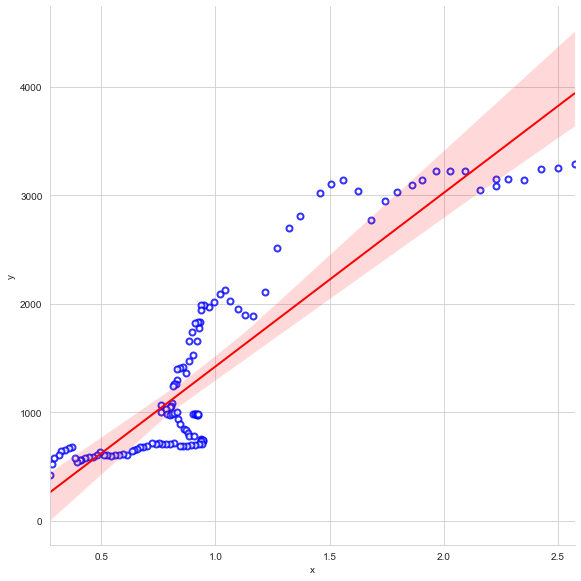

In [52]:
# 3. No. of Deaths (7 day) <- No. of cases reported in the previous 14 days (in millions)

# The best fit, on visual discrimination is the linear model in 1 variable (simple linear line)

df = pd.DataFrame({'x': regression_df["14_day_rolling"], 'y': regression_df.deaths_7_day_rolling_avg})
display(df.head())
ax = sns.lmplot('x', 'y', data=df, height=8, order=1,
           scatter_kws={'color':'white', 
                        'marker':'o', 
                        'edgecolor':'blue', 
                        'linewidths':2}
          ,line_kws={'color':'red', 'linewidth':2}, 
           ci=99.99)


In [53]:
from statsmodels.regression.linear_model import OLS
from sklearn.preprocessing import PolynomialFeatures
import statsmodels.api as sm

In [54]:
X1 = regression_df[["log_fully_vaccinated_per_hundred", "14_day_rolling"]]

X2 = regression_df[["log_vaccinated_per_hundred", "14_day_rolling"]]
X2 = sm.add_constant(X2)


model1 = OLS(regression_df.deaths_7_day_rolling_avg, X1)
model2 = OLS(regression_df.deaths_7_day_rolling_avg, X2)

In [55]:
results1 = model1.fit()
results2 = model2.fit()

In [56]:
display(results1.summary())
display(results2.summary())

<class 'statsmodels.iolib.summary.Summary'>
"""
                                    OLS Regression Results                                   
=============================================================================================
Dep. Variable:     deaths_7_day_rolling_avg   R-squared (uncentered):                   0.949
Model:                                  OLS   Adj. R-squared (uncentered):              0.948
Method:                       Least Squares   F-statistic:                              1161.
Date:                      Fri, 04 Jun 2021   Prob (F-statistic):                    6.90e-82
Time:                              21:32:03   Log-Likelihood:                         -940.23
No. Observations:                       128   AIC:                                      1884.
Df Residuals:                           126   BIC:                                      1890.
Df Model:                                 2                                                  
Covariance Type:                  nonrobust                                                  
====================================================================================================
                                       coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------
log_fully_vaccinated_per_hundred   -70.6065     16.455     -4.291      0.000    -103.170     -38.043
14_day_rolling                    1576.8348     41.404     38.084      0.000    1494.898    1658.772
==============================================================================
Omnibus:                        9.759   Durbin-Watson:                   0.045
Prob(Omnibus):                  0.008   Jarque-Bera (JB):                4.078
Skew:                           0.130   Prob(JB):                        0.130
Kurtosis:                       2.165   Cond. No.                         3.71
==============================================================================

Notes:
[1] R² is computed without centering (uncentered) since the model does not contain a constant.
[2] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

<class 'statsmodels.iolib.summary.Summary'>
"""
                               OLS Regression Results                               
====================================================================================
Dep. Variable:     deaths_7_day_rolling_avg   R-squared:                       0.954
Model:                                  OLS   Adj. R-squared:                  0.953
Method:                       Least Squares   F-statistic:                     1301.
Date:                      Fri, 04 Jun 2021   Prob (F-statistic):           2.17e-84
Time:                              21:32:03   Log-Likelihood:                -854.70
No. Observations:                       128   AIC:                             1715.
Df Residuals:                           125   BIC:                             1724.
Df Model:                                 2                                         
Covariance Type:                  nonrobust                                         
==============================================================================================
                                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------
const                       4753.5595    250.097     19.007      0.000    4258.586    5248.533
log_vaccinated_per_hundred -1149.8999     57.658    -19.943      0.000   -1264.013   -1035.787
14_day_rolling               329.6189     72.220      4.564      0.000     186.686     472.552
==============================================================================
Omnibus:                        9.963   Durbin-Watson:                   0.143
Prob(Omnibus):                  0.007   Jarque-Bera (JB):               10.009
Skew:                           0.658   Prob(JB):                      0.00671
Kurtosis:                       3.382   Cond. No.                         54.5
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [57]:
from sklearn.linear_model import LinearRegression

model1 = LinearRegression(fit_intercept=False)

fit1 = model1.fit(X1, regression_df.deaths_7_day_rolling_avg)

print('The intercept of the line is: {0}'.format(fit1.intercept_))
print('The coeff of the line are: {0}'.format([round(x,2) for x in fit1.coef_]))


model2 = LinearRegression()

fit2 = model2.fit(X2, regression_df.deaths_7_day_rolling_avg)

print('The intercept of the line is: {0}'.format(fit2.intercept_))
print('The coeff of the line are: {0}'.format([round(x,2) for x in fit2.coef_]))


The intercept of the line is: 0.0
The coeff of the line are: [-70.61, 1576.83]
The intercept of the line is: 4753.559512505328
The coeff of the line are: [0.0, -1149.9, 329.62]


### We have 2 models that explain the data:

1. deaths_7_day_rolling_avg = -70.61 * log(fully_vaccinated_per_hundred) + 1576.83 * 14_day_rolling_sum (rolling sum of cases for previous 14 days, in Millions)

2. deaths_7_day_rolling_avg = 4753.56 - 1149.9 * log(vaccinated_per_hundred) + 329.62 * 14_day_rolling_sum (rolling sum of cases for previous 14 days, in Millions)

The R^2 score in bnoth cases is above 0.94
The P-Value is below 0.05

## So there is a strong co-relation between the vaccination drive & the drop in deaths seen over time.